In [94]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import plotly.express as px

DATA COLLECTION

In [95]:
#READ DATASET
data = pd.read_csv("COVID-19_Tests__Cases__and_Deaths__By_Town__-_ARCHIVE.csv")

In [96]:
data

,Last update date,Town number,Town,Total cases,Confirmed cases,Probable cases,Case rate,Total deaths,Confirmed deaths,Probable deaths,People tested,Rate tested per 100k,Number of tests,Number of positives,Number of negatives,Number of indeterminates
0,01/17/2021,1,Andover,118,109.0,9.0,3652.0,2,2.0,0.0,1386.0,42897.0,3018.0,134.0,2882.0,2.0
1,01/17/2021,2,Ansonia,1236,1131.0,105.0,6602.0,20,13.0,7.0,8358.0,44645.0,22604.0,1451.0,21074.0,79.0
2,01/17/2021,3,Ashford,158,155.0,3.0,3708.0,3,3.0,0.0,1917.0,44989.0,4432.0,180.0,4249.0,3.0
3,01/17/2021,4,Avon,614,591.0,23.0,3355.0,63,52.0,11.0,8980.0,49066.0,23448.0,700.0,22712.0,36.0
4,01/17/2021,5,Barkhamsted,115,112.0,3.0,3173.0,1,1.0,0.0,1521.0,41970.0,3877.0,126.0,3743.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102240,06/24/2022,165,Windsor Locks,2702,2507.0,195.0,21021.0,44,40.0,4.0,10507.0,81741.0,44778.0,3347.0,41376.0,55.0
102241,06/24/2022,166,Wolcott,4089,3557.0,532.0,24652.0,64,54.0,10.0,14324.0,86357.0,71416.0,5163.0,66148.0,105.0
102242,06/24/2022,167,Woodbridge,1699,1519.0,180.0,19417.0,48,42.0,6.0,8668.0,99063.0,50559.0,2115.0,48373.0,71.0
102243,06/24/2022,168,Woodbury,1646,1367.0,279.0,17323.0,12,10.0,2.0,7918.0,83330.0,34243.0,2023.0,32192.0,28.0


In [97]:
data.info()       #DATASET INFORMATION

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102245 entries, 0 to 102244
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Last update date          102245 non-null  object 
 1   Town number               102245 non-null  int64  
 2   Town                      102245 non-null  object 
 3   Total cases               102245 non-null  int64  
 4   Confirmed cases           90753 non-null   float64
 5   Probable cases            90753 non-null   float64
 6   Case rate                 98358 non-null   float64
 7   Total deaths              102245 non-null  int64  
 8   Confirmed deaths          90753 non-null   float64
 9   Probable deaths           90753 non-null   float64
 10  People tested             93288 non-null   float64
 11  Rate tested per 100k      92612 non-null   float64
 12  Number of tests           90753 non-null   float64
 13  Number of positives       90753 non-null   f

In [98]:
data.drop(['Town number', 'Last update date'], inplace=True, axis = 1)  #DROP IRRELEVANT COLLUMNS

In [99]:
data

,Town,Total cases,Confirmed cases,Probable cases,Case rate,Total deaths,Confirmed deaths,Probable deaths,People tested,Rate tested per 100k,Number of tests,Number of positives,Number of negatives,Number of indeterminates
0,Andover,118,109.0,9.0,3652.0,2,2.0,0.0,1386.0,42897.0,3018.0,134.0,2882.0,2.0
1,Ansonia,1236,1131.0,105.0,6602.0,20,13.0,7.0,8358.0,44645.0,22604.0,1451.0,21074.0,79.0
2,Ashford,158,155.0,3.0,3708.0,3,3.0,0.0,1917.0,44989.0,4432.0,180.0,4249.0,3.0
3,Avon,614,591.0,23.0,3355.0,63,52.0,11.0,8980.0,49066.0,23448.0,700.0,22712.0,36.0
4,Barkhamsted,115,112.0,3.0,3173.0,1,1.0,0.0,1521.0,41970.0,3877.0,126.0,3743.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102240,Windsor Locks,2702,2507.0,195.0,21021.0,44,40.0,4.0,10507.0,81741.0,44778.0,3347.0,41376.0,55.0
102241,Wolcott,4089,3557.0,532.0,24652.0,64,54.0,10.0,14324.0,86357.0,71416.0,5163.0,66148.0,105.0
102242,Woodbridge,1699,1519.0,180.0,19417.0,48,42.0,6.0,8668.0,99063.0,50559.0,2115.0,48373.0,71.0
102243,Woodbury,1646,1367.0,279.0,17323.0,12,10.0,2.0,7918.0,83330.0,34243.0,2023.0,32192.0,28.0


In [100]:
def num_cat(data):                                           #FUNCTION TO SEPERATE CATAGORICAL AND NUMERICAL
    cat_col = [col for col in data.columns if data[col].dtype == 'object']       
    num_col = [col for col in data.columns if data[col].dtype != 'object']
    return cat_col, num_col

In [101]:
cat_col, num_col = num_cat(data)

In [102]:
cat_col

['Town']

In [103]:
num_col

['Total cases ',
 'Confirmed cases',
 'Probable cases',
 'Case rate',
 'Total deaths',
 'Confirmed deaths',
 'Probable deaths',
 'People tested',
 'Rate tested per 100k',
 'Number of tests',
 'Number of positives',
 'Number of negatives',
 'Number of indeterminates']

#DATA ANALYSIS

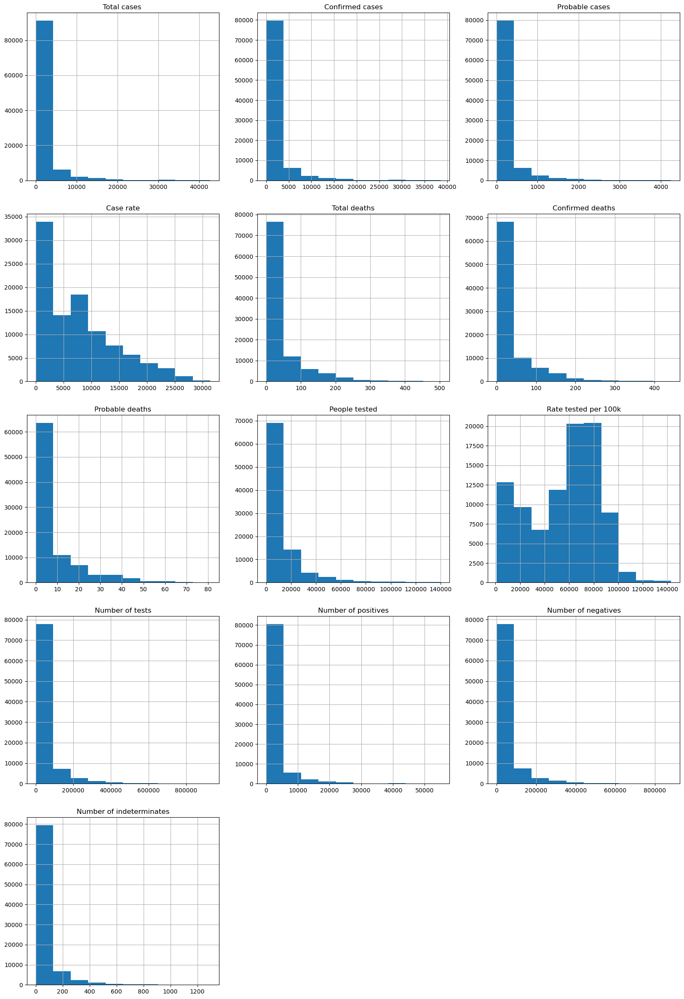

In [104]:
plt.figure(figsize=(20,30))      

for i, feature in enumerate(num_col):
    plt.subplot(5,3,i+1)
    data[feature].hist()
    plt.title(feature)

In [105]:
data['Town'].nunique()    #NO. OF UNIQUE TOWNS

169

<AxesSubplot:>

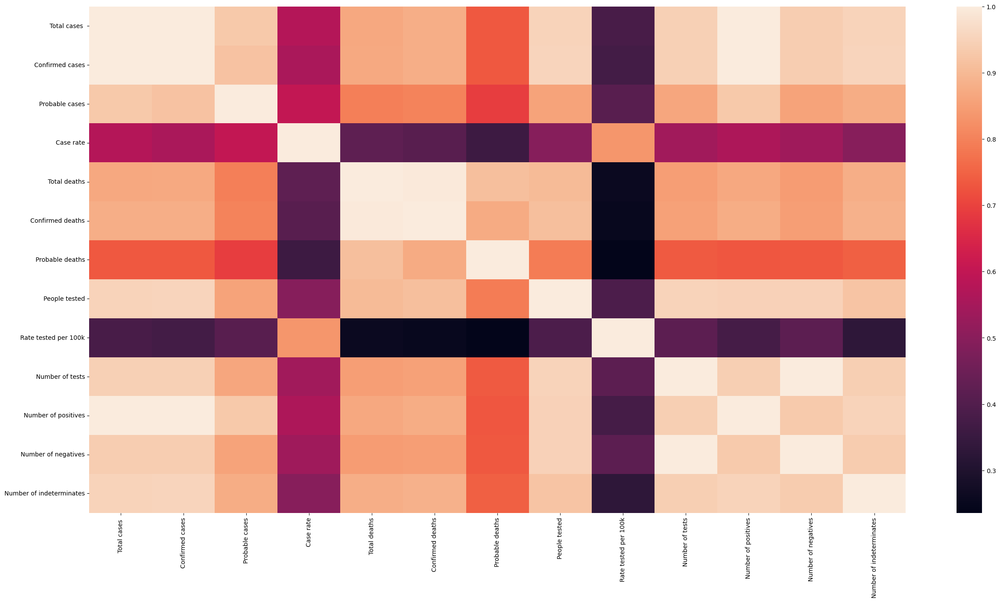

In [106]:
plt.figure(figsize=(30,15))     #CORRELATION HEATMAP 
cor = data.corr()
sb.heatmap(cor)

DATA VISUALIZATION

In [107]:
px.scatter(data, x= 'Town', y= 'Total deaths')   # TOWN VS TOTAL DEATHS

In [108]:
px.scatter(data, x= 'Total cases ', y = 'Total deaths')    #TOTAL CASES VS TOTAL DEATHS

In [109]:
px.line(data, x= 'Number of tests', y = 'Number of positives')    #NO. OF TESTS VS NO. OF POSITIVES

In [110]:
px.box(data,x = 'Total deaths', y='Number of tests')    #TOTAL DEATHS VS NO. OF TESTS

In [111]:
data

,Town,Total cases,Confirmed cases,Probable cases,Case rate,Total deaths,Confirmed deaths,Probable deaths,People tested,Rate tested per 100k,Number of tests,Number of positives,Number of negatives,Number of indeterminates
0,Andover,118,109.0,9.0,3652.0,2,2.0,0.0,1386.0,42897.0,3018.0,134.0,2882.0,2.0
1,Ansonia,1236,1131.0,105.0,6602.0,20,13.0,7.0,8358.0,44645.0,22604.0,1451.0,21074.0,79.0
2,Ashford,158,155.0,3.0,3708.0,3,3.0,0.0,1917.0,44989.0,4432.0,180.0,4249.0,3.0
3,Avon,614,591.0,23.0,3355.0,63,52.0,11.0,8980.0,49066.0,23448.0,700.0,22712.0,36.0
4,Barkhamsted,115,112.0,3.0,3173.0,1,1.0,0.0,1521.0,41970.0,3877.0,126.0,3743.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102240,Windsor Locks,2702,2507.0,195.0,21021.0,44,40.0,4.0,10507.0,81741.0,44778.0,3347.0,41376.0,55.0
102241,Wolcott,4089,3557.0,532.0,24652.0,64,54.0,10.0,14324.0,86357.0,71416.0,5163.0,66148.0,105.0
102242,Woodbridge,1699,1519.0,180.0,19417.0,48,42.0,6.0,8668.0,99063.0,50559.0,2115.0,48373.0,71.0
102243,Woodbury,1646,1367.0,279.0,17323.0,12,10.0,2.0,7918.0,83330.0,34243.0,2023.0,32192.0,28.0


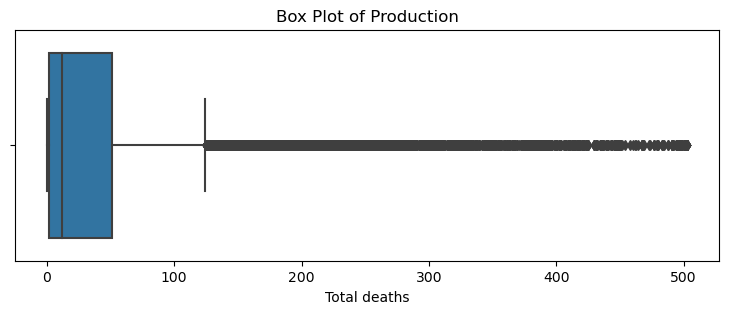

In [112]:
plt.figure(figsize=(20,3))     #BOX PLOT ANALYSIS

plt.subplot(1,2,1)
sb.boxplot(x=data['Total deaths'])
plt.title(f'Box Plot of Production')
plt.show()

DATA CLEANING

In [113]:
data.isna().sum().sort_values(ascending = False)   # NULL VALUES

Confirmed cases             11492
Probable cases              11492
Confirmed deaths            11492
Probable deaths             11492
Number of tests             11492
Number of positives         11492
Number of negatives         11492
Number of indeterminates    11492
Rate tested per 100k         9633
People tested                8957
Case rate                    3887
Town                            0
Total cases                     0
Total deaths                    0
dtype: int64

In [114]:
data.dropna(inplace=True)  #DROP NULL VALUES

In [115]:
data.isna().sum()

Town                        0
Total cases                 0
Confirmed cases             0
Probable cases              0
Case rate                   0
Total deaths                0
Confirmed deaths            0
Probable deaths             0
People tested               0
Rate tested per 100k        0
Number of tests             0
Number of positives         0
Number of negatives         0
Number of indeterminates    0
dtype: int64

In [116]:
data

,Town,Total cases,Confirmed cases,Probable cases,Case rate,Total deaths,Confirmed deaths,Probable deaths,People tested,Rate tested per 100k,Number of tests,Number of positives,Number of negatives,Number of indeterminates
0,Andover,118,109.0,9.0,3652.0,2,2.0,0.0,1386.0,42897.0,3018.0,134.0,2882.0,2.0
1,Ansonia,1236,1131.0,105.0,6602.0,20,13.0,7.0,8358.0,44645.0,22604.0,1451.0,21074.0,79.0
2,Ashford,158,155.0,3.0,3708.0,3,3.0,0.0,1917.0,44989.0,4432.0,180.0,4249.0,3.0
3,Avon,614,591.0,23.0,3355.0,63,52.0,11.0,8980.0,49066.0,23448.0,700.0,22712.0,36.0
4,Barkhamsted,115,112.0,3.0,3173.0,1,1.0,0.0,1521.0,41970.0,3877.0,126.0,3743.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102240,Windsor Locks,2702,2507.0,195.0,21021.0,44,40.0,4.0,10507.0,81741.0,44778.0,3347.0,41376.0,55.0
102241,Wolcott,4089,3557.0,532.0,24652.0,64,54.0,10.0,14324.0,86357.0,71416.0,5163.0,66148.0,105.0
102242,Woodbridge,1699,1519.0,180.0,19417.0,48,42.0,6.0,8668.0,99063.0,50559.0,2115.0,48373.0,71.0
102243,Woodbury,1646,1367.0,279.0,17323.0,12,10.0,2.0,7918.0,83330.0,34243.0,2023.0,32192.0,28.0


DATA PREPROCESSING

In [117]:
from sklearn.preprocessing import LabelEncoder    # CATEGORICAL -> NUMERICAL

In [118]:
#Label Encoding
for i in cat_col:
    data[i] = LabelEncoder().fit_transform(data[i])

In [119]:
data

,Town,Total cases,Confirmed cases,Probable cases,Case rate,Total deaths,Confirmed deaths,Probable deaths,People tested,Rate tested per 100k,Number of tests,Number of positives,Number of negatives,Number of indeterminates
0,0,118,109.0,9.0,3652.0,2,2.0,0.0,1386.0,42897.0,3018.0,134.0,2882.0,2.0
1,1,1236,1131.0,105.0,6602.0,20,13.0,7.0,8358.0,44645.0,22604.0,1451.0,21074.0,79.0
2,2,158,155.0,3.0,3708.0,3,3.0,0.0,1917.0,44989.0,4432.0,180.0,4249.0,3.0
3,3,614,591.0,23.0,3355.0,63,52.0,11.0,8980.0,49066.0,23448.0,700.0,22712.0,36.0
4,4,115,112.0,3.0,3173.0,1,1.0,0.0,1521.0,41970.0,3877.0,126.0,3743.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102240,164,2702,2507.0,195.0,21021.0,44,40.0,4.0,10507.0,81741.0,44778.0,3347.0,41376.0,55.0
102241,165,4089,3557.0,532.0,24652.0,64,54.0,10.0,14324.0,86357.0,71416.0,5163.0,66148.0,105.0
102242,166,1699,1519.0,180.0,19417.0,48,42.0,6.0,8668.0,99063.0,50559.0,2115.0,48373.0,71.0
102243,167,1646,1367.0,279.0,17323.0,12,10.0,2.0,7918.0,83330.0,34243.0,2023.0,32192.0,28.0


In [120]:
#Inter Quartile Range
q1 = data.quantile(0.25)
q3 = data.quantile(0.75)
IQR = q3 -q1 
IQR

Town                           84.0
Total cases                  1920.0
Confirmed cases              1719.0
Probable cases                177.0
Case rate                    9825.0
Total deaths                   53.0
Confirmed deaths               42.0
Probable deaths                11.0
People tested               12742.0
Rate tested per 100k        44163.0
Number of tests             48976.0
Number of positives          2309.0
Number of negatives         46547.0
Number of indeterminates       55.0
dtype: float64

In [121]:
upper = q3 + 1.5*IQR
lower = q1 - 1.5*IQR
print('Upper bound :\n {} \n\n Lower bound :\n {}'.format(upper,lower))

Upper bound :
 Town                           252.0
Total cases                   4991.0
Confirmed cases               4474.5
Probable cases                 451.5
Case rate                    26778.5
Total deaths                   135.5
Confirmed deaths               107.0
Probable deaths                 27.5
People tested                34072.0
Rate tested per 100k        144044.5
Number of tests             127701.0
Number of positives           5998.5
Number of negatives         121376.5
Number of indeterminates       141.5
dtype: float64 

 Lower bound :
 Town                          -84.0
Total cases                 -2689.0
Confirmed cases             -2401.5
Probable cases               -256.5
Case rate                  -12521.5
Total deaths                  -76.5
Confirmed deaths              -61.0
Probable deaths               -16.5
People tested              -16896.0
Rate tested per 100k       -32607.5
Number of tests            -68203.0
Number of positives         -3237.5
Nu

In [122]:
# Outlier removal
for feature in data.columns:
    q1 = data[feature].quantile(0.25)
    q3 = data[feature].quantile(0.75)
    IQR = q3 -q1
    
    #Upper and lower bound
    upper = q3 + 1.5*IQR
    lower = q1 - 1.5*IQR
    df = data[(data[feature] < upper) & (data[feature] > lower)]
    

In [123]:
df

,Town,Total cases,Confirmed cases,Probable cases,Case rate,Total deaths,Confirmed deaths,Probable deaths,People tested,Rate tested per 100k,Number of tests,Number of positives,Number of negatives,Number of indeterminates
0,0,118,109.0,9.0,3652.0,2,2.0,0.0,1386.0,42897.0,3018.0,134.0,2882.0,2.0
1,1,1236,1131.0,105.0,6602.0,20,13.0,7.0,8358.0,44645.0,22604.0,1451.0,21074.0,79.0
2,2,158,155.0,3.0,3708.0,3,3.0,0.0,1917.0,44989.0,4432.0,180.0,4249.0,3.0
3,3,614,591.0,23.0,3355.0,63,52.0,11.0,8980.0,49066.0,23448.0,700.0,22712.0,36.0
4,4,115,112.0,3.0,3173.0,1,1.0,0.0,1521.0,41970.0,3877.0,126.0,3743.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102240,164,2702,2507.0,195.0,21021.0,44,40.0,4.0,10507.0,81741.0,44778.0,3347.0,41376.0,55.0
102241,165,4089,3557.0,532.0,24652.0,64,54.0,10.0,14324.0,86357.0,71416.0,5163.0,66148.0,105.0
102242,166,1699,1519.0,180.0,19417.0,48,42.0,6.0,8668.0,99063.0,50559.0,2115.0,48373.0,71.0
102243,167,1646,1367.0,279.0,17323.0,12,10.0,2.0,7918.0,83330.0,34243.0,2023.0,32192.0,28.0


In [124]:
data.shape   #Before outlier removal

(90753, 14)

In [125]:
df.shape   # After outlier removal

(80687, 14)

In [126]:
#Feature scaling
from sklearn.preprocessing import MinMaxScaler
X = df.drop(['Confirmed deaths','Probable deaths', 'Total deaths'], axis = 1)
Y = df['Total deaths']
scalar = MinMaxScaler()
x = pd.DataFrame(scalar.fit_transform(X), index = Y.index)
x.columns = X.columns

In [127]:
x

,Town,Total cases,Confirmed cases,Probable cases,Case rate,People tested,Rate tested per 100k,Number of tests,Number of positives,Number of negatives,Number of indeterminates
0,0.000000,0.011534,0.011840,0.005322,0.136126,0.023134,0.293974,0.013588,0.010580,0.013293,0.014184
1,0.005952,0.120809,0.122855,0.062093,0.246086,0.140948,0.306289,0.102272,0.114568,0.097554,0.560284
2,0.011905,0.015443,0.016837,0.001774,0.138214,0.032107,0.308713,0.019991,0.014212,0.019625,0.021277
3,0.017857,0.060014,0.064197,0.013601,0.125056,0.151458,0.337436,0.106093,0.055270,0.105141,0.255319
4,0.023810,0.011240,0.012166,0.001774,0.118272,0.025415,0.287443,0.017478,0.009949,0.017281,0.056738
...,...,...,...,...,...,...,...,...,...,...,...
102240,0.976190,0.264099,0.272322,0.115316,0.783547,0.177262,0.567637,0.202673,0.264272,0.191589,0.390071
102241,0.982143,0.399668,0.386378,0.314607,0.918891,0.241762,0.600158,0.323287,0.407659,0.306327,0.744681
102242,0.988095,0.166064,0.165001,0.106446,0.723759,0.146186,0.689674,0.228849,0.166996,0.223997,0.503546
102243,0.994048,0.160884,0.148490,0.164991,0.645706,0.133512,0.578832,0.154972,0.159732,0.149050,0.198582


In [128]:
#KBest features
from sklearn.feature_selection import chi2, SelectKBest  
k_best = SelectKBest(score_func= chi2, k= 8)
scores = k_best.fit(x, Y)
scores.scores_

score_df = pd.DataFrame(data= scores.scores_, columns= ['Scores'])
score_df

x_col = pd.DataFrame(data=x.columns, columns=['Columns'])
x_col

combine_df = pd.concat([x_col, score_df], axis=1)
combine_df
combine_df = combine_df.nlargest(8, 'Scores')

optimized_df = x[combine_df['Columns']]
optimized_df

,Number of indeterminates,Number of tests,Confirmed cases,Number of negatives,Total cases,People tested,Number of positives,Probable cases
0,0.014184,0.013588,0.011840,0.013293,0.011534,0.023134,0.010580,0.005322
1,0.560284,0.102272,0.122855,0.097554,0.120809,0.140948,0.114568,0.062093
2,0.021277,0.019991,0.016837,0.019625,0.015443,0.032107,0.014212,0.001774
3,0.255319,0.106093,0.064197,0.105141,0.060014,0.151458,0.055270,0.013601
4,0.056738,0.017478,0.012166,0.017281,0.011240,0.025415,0.009949,0.001774
...,...,...,...,...,...,...,...,...
102240,0.390071,0.202673,0.272322,0.191589,0.264099,0.177262,0.264272,0.115316
102241,0.744681,0.323287,0.386378,0.306327,0.399668,0.241762,0.407659,0.314607
102242,0.503546,0.228849,0.165001,0.223997,0.166064,0.146186,0.166996,0.106446
102243,0.198582,0.154972,0.148490,0.149050,0.160884,0.133512,0.159732,0.164991


In [129]:
optimized_df.insert(loc=len(optimized_df.columns), column='Total deaths', value=Y)
df = optimized_df

MODEL BUILDING

In [130]:
X = df.drop('Total deaths', axis = 1)
Y = df['Total deaths']

In [131]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.3, random_state= 100)

In [132]:
def legend(results):
    extra = plt.Rectangle((0, 0), 0, 0, fc="w", fill=False, edgecolor='none', linewidth=0)
    plt.legend([extra],[results])

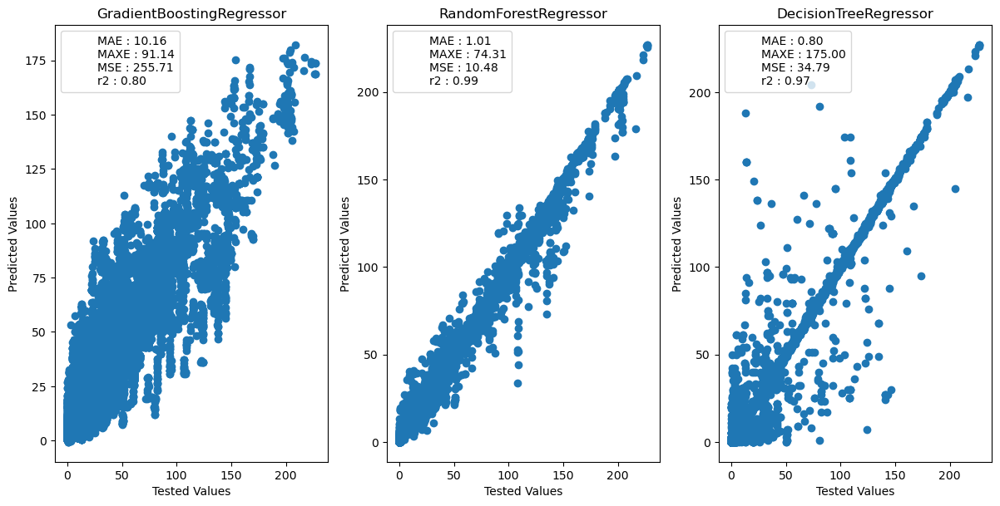

In [133]:
#MODEL BUILDING
from sklearn.metrics import mean_absolute_error, max_error, mean_absolute_percentage_error, mean_squared_error, mean_squared_log_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

MAE = []
MAXE = []
MSE = []
r2 = []

GBR = GradientBoostingRegressor()
RFR = RandomForestRegressor()
DTR = DecisionTreeRegressor()

est = [('GradientBoostingRegressor',GBR), ('RandomForestRegressor',RFR), ('DecisionTreeRegressor',DTR)]

plt.figure(figsize=(60,70))

for i, (name,model) in zip(range(len(est)), est): 
    plt.subplot(12,15,i+1)
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    plt.scatter(Y_test, Y_pred)
    legend(('MAE : {:.2f}' + '\n'+'MAXE : {:.2f}'+'\n' + 'MSE : {:.2f}' + '\n' + 'r2 : {:.2f}')
          .format(mean_absolute_error(Y_test, Y_pred), max_error(Y_test, Y_pred), mean_squared_error(Y_test, Y_pred),r2_score(Y_test, Y_pred)))
    plt.title(name)
    plt.xlabel('Tested Values')
    plt.ylabel('Predicted Values')
    plt.tight_layout()
    
    
    MAE.append(mean_absolute_error(Y_test, Y_pred))
    MAXE.append(max_error(Y_test, Y_pred))
    MSE.append(mean_squared_error(Y_test, Y_pred))
    r2.append(r2_score(Y_test, Y_pred))
    

In [134]:
print('Average Model Measurement Values : \n')      # MEASUREMENTS 
print('MAE : {:.2f} +/- {:.2f} \n'.format(np.mean(MAE), np.std(MAE)))
print('MAXE : {:.2f} +/- {:.2f} \n'.format(np.mean(MAXE), np.std(MAXE)))
print('MSE : {:.2f} +/- {:.2f} \n'.format(np.mean(MSE), np.std(MSE)))
print('R2 : {:.2f} +/- {:.2f} \n'.format(np.mean(r2), np.std(r2)))

Average Model Measurement Values : 

MAE : 3.99 +/- 4.36 

MAXE : 113.48 +/- 44.04 

MSE : 100.33 +/- 110.32 

R2 : 0.92 +/- 0.09 

